## Paso a Lab

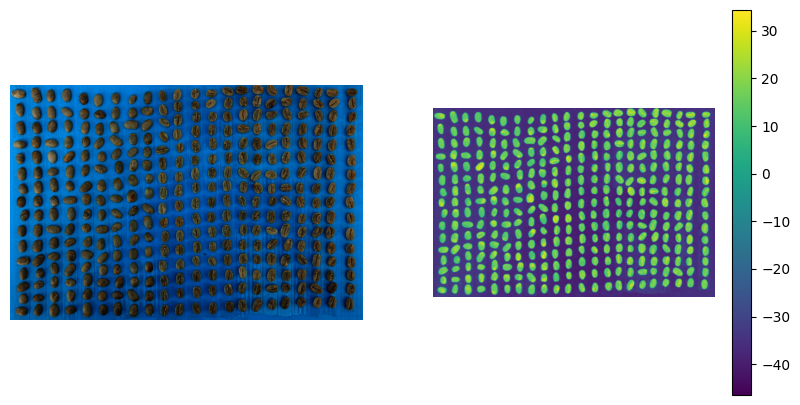

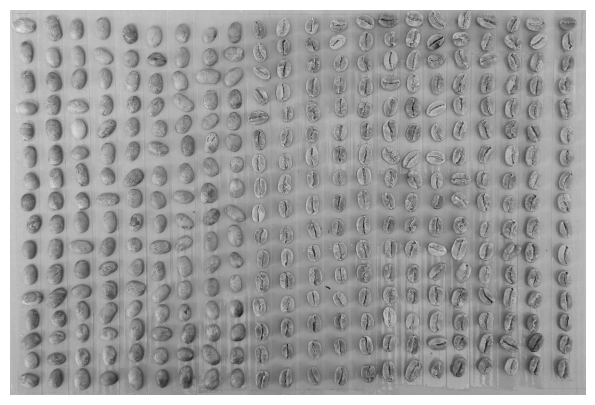

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

RGB_LAB_MATRIX_D65 = np.array([[0.4124, 0.3576, 0.1805],
                               [0.2126, 0.7152, 0.0722],
                               [0.0193, 0.1192, 0.9505]])

XYZ_D65_STANDAR_ILUMINATION = np.array([0.950456, 1.0, 1.088754])
EPSILON = 216 / 24389


def read_image(path):
    image = cv.imread(path)[...,::-1]/255
    return image

def RGB2Lab(image):
    lab_image = cv.cvtColor(image, cv.COLOR_RGB2Lab)
    return lab_image

def unfolding(img:np.ndarray):
    rows, columns, bands = img.shape
    img_unfold = np.reshape(img,(rows*columns,bands))
    return img_unfold

def folding(img:np.ndarray, rows, columns, bands):
    img_fold = np.reshape(img,(rows,columns,bands))
    return img_fold

def _companding_sRGB(rgb_values: np.ndarray):

    idx = rgb_values <= 0.04045
    rgb_values[idx] =  rgb_values[idx]/(12.92)
    rgb_values[~idx] = ((rgb_values[~idx]+0.055)/1.055)**2.4
    return rgb_values

def image_gray(lab_image: np.ndarray):
    """
    Convierte una imagen en el espacio Lab a escala de grises.
    Utiliza el canal L (luminancia) para representar la imagen en escala de grises.

    Args:
        lab_image (np.ndarray): Imagen en el espacio Lab con forma (filas, columnas, 3).

    Returns:
        np.ndarray: Imagen en escala de grises con forma (filas, columnas).
    """
    # Extraer el canal L (luminancia)
    gray_image = lab_image[..., 0]

    # Asegurarse de que los valores estén en el rango [0, 100] (rango típico de L en Lab)
    gray_image = np.clip(gray_image, 0, 100)

    return gray_image


def _RGB2Lab(array_RGB: np.ndarray,fold: bool = True):

    if array_RGB.ndim == 3:
        rows, columns, bands = array_RGB.shape
        array_RGB = unfolding(array_RGB)
    array_RGB = _companding_sRGB(array_RGB)
    xyz_linear = np.dot(array_RGB, RGB_LAB_MATRIX_D65.T)
    xyz_normalized = xyz_linear / XYZ_D65_STANDAR_ILUMINATION
    linear_condition = xyz_normalized > EPSILON
    XYZ = np.where(linear_condition, xyz_normalized ** (1 / 3), (xyz_normalized * 903.3 + 16) / 116)
    L = 116 * XYZ[:, 1] - 16
    L = np.clip(L, 0, 100)
    a = 500 * (XYZ[:, 0] - XYZ[:, 1])
    b = 200 * (XYZ[:, 1] - XYZ[:, 2])
    Lab = np.column_stack((L, a, b))
    if fold is True:
        Lab = folding(Lab, rows, columns, bands)
    return Lab


#image_path = '/content/drive/MyDrive/cafe_ind/cafe_guia_enfermos_1.jpg'
image_path = '/content/drive/MyDrive/cafe_ind/cafe_guia_sanos_1.jpg'
image = read_image(image_path)
lab_image = _RGB2Lab(image)
gray_image = image_gray(lab_image)

plt.figure(figsize=(10, 5))
plt.subplot(1,2,1)
plt.imshow(image)
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(lab_image[...,2])
plt.colorbar()
plt.axis('off')

plt.show()

plt.figure(figsize=(10, 5))
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
plt.show()


## Mascara binaria


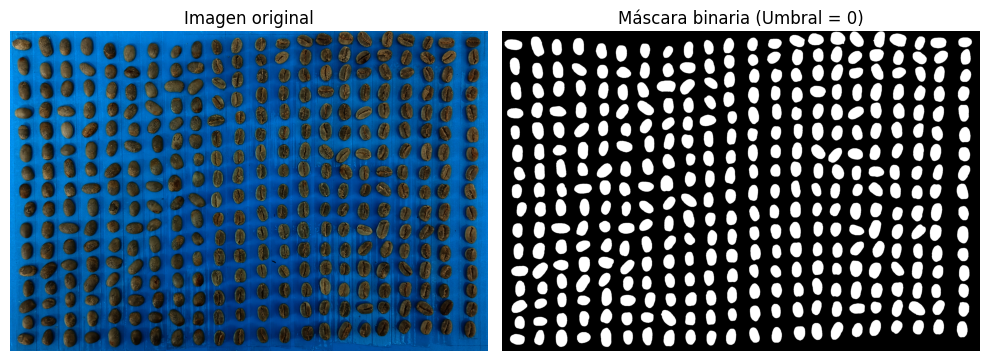

In [ ]:
def binary_mask(lab_image: np.ndarray, threshold: float = 0):

    # Generar la máscara binaria a partir del canal b
    binary_mask_result = lab_image[..., 2] > threshold

    # Devolver la información como una tupla
    return lab_image, binary_mask_result, threshold
# Llamar a la función para generar la máscara binaria
threshold = 0  # Umbral para la máscara
binarization_tuple = binary_mask(lab_image, threshold)

# Extraer los elementos de la tupla
original_lab_image, binary_mask_result, used_threshold = binarization_tuple

# Visualizar los resultados
plt.figure(figsize=(10, 5))

# Imagen original
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Imagen original")

# Máscara binaria
plt.subplot(1, 2, 2)
plt.imshow(binary_mask_result, cmap='gray')
plt.axis('off')
plt.title(f"Máscara binaria (Umbral = {used_threshold})")

plt.tight_layout()
plt.show()

##Detección de bordes y cierre morfológico

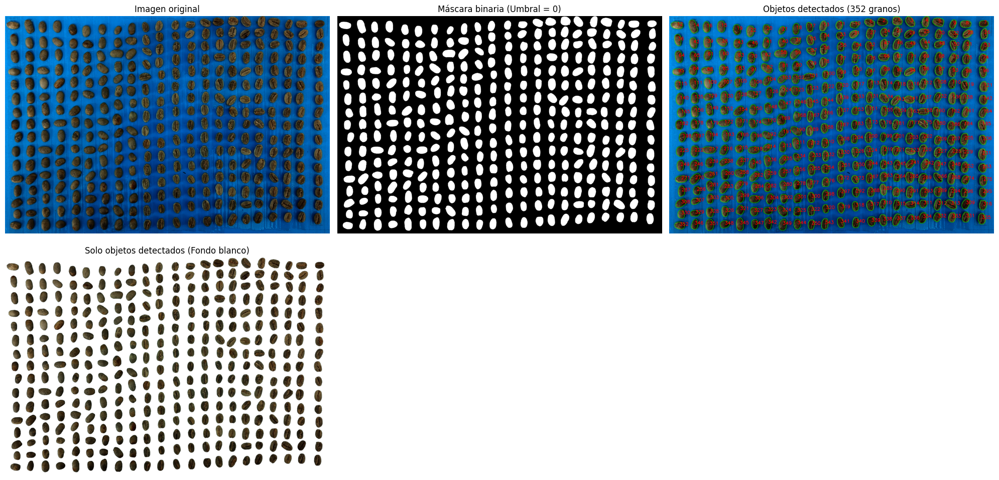

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

def detect_objects_with_contours(binary_mask: np.ndarray, min_width: int = 10, min_height: int = 10):

    # Convertir la máscara binaria a uint8 (requerido por OpenCV)
    binary_mask_uint8 = (binary_mask.astype(np.uint8) * 255)

    # Encontrar contornos en la máscara binaria
    contours, _ = cv.findContours(binary_mask_uint8, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Crear una copia de la imagen original para dibujar los contornos
    labeled_image = np.array(image.copy())  # Copiar la imagen original

    # Crear una imagen con fondo blanco para almacenar solo los objetos detectados
    objects_only_image = np.ones_like(image)  # Inicializar con fondo blanco (valores [1, 1, 1] en RGB normalizado)

    # Lista para almacenar los centroides y sus correspondientes contornos
    centroids_and_contours = []

    # Procesar cada contorno
    for c in contours:
        # Obtener el rectángulo delimitador del contorno
        x, y, w, h = cv.boundingRect(c)

        # Filtrar contornos pequeños para evitar falsos positivos
        if w > min_width and h > min_height:
            # Calcular el centroide aproximado
            center_x, center_y = x + w // 2, y + h // 2

            # Guardar el centroide y el contorno
            centroids_and_contours.append(((center_y, center_x), c))

    # Ordenar los contornos de arriba a abajo y de izquierda a derecha
    centroids_and_contours.sort(key=lambda x: (x[0][0], x[0][1]))  # Primero por y, luego por x

    # Dibujar los contornos ordenados y numerarlos
    for i, (_, c) in enumerate(centroids_and_contours, start=1):
        # Obtener el rectángulo delimitador del contorno
        x, y, w, h = cv.boundingRect(c)

        # Aplicar la máscara binaria directamente para recortar el objeto
        object_region = image[y:y+h, x:x+w]
        mask_region = binary_mask_uint8[y:y+h, x:x+w]
        object_region = cv.bitwise_and(object_region, object_region, mask=mask_region)

        # Copiar el objeto recortado sobre el fondo blanco
        objects_only_image[y:y+h, x:x+w][mask_region > 0] = object_region[mask_region > 0]

        # Dibujar el contorno del objeto
        cv.drawContours(labeled_image, [c], -1, (0, 1, 0), 2)  # Verde en RGB normalizado

        # Colocar el número del objeto en el centro del contorno
        cv.putText(
            labeled_image, str(i), (x + w // 2, y + h // 2),
            cv.FONT_HERSHEY_SIMPLEX, 1.5, (1, 0, 0), 4, cv.LINE_AA  # Azul en RGB normalizado
        )

    return labeled_image, len(centroids_and_contours), objects_only_image


# Detectar objetos en la máscara binaria
min_width = 10  # Ancho mínimo del contorno
min_height = 10  # Altura mínima del contorno
labeled_image, count, objects_only_image = detect_objects_with_contours(binary_mask_result, min_width, min_height)

# Visualizar los resultados
plt.figure(figsize=(20, 10))

# Imagen original
plt.subplot(2, 3, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Imagen original")

# Máscara binaria
plt.subplot(2, 3, 2)
plt.imshow(binary_mask_result, cmap='gray')
plt.axis('off')
plt.title(f"Máscara binaria (Umbral = {used_threshold})")

# Objetos detectados con contornos numerados
plt.subplot(2, 3, 3)
plt.imshow(labeled_image)
plt.axis('off')
plt.title(f"Objetos detectados ({count} granos)")

# Imagen con solo los objetos detectados (fondo blanco)
plt.subplot(2, 3, 4)
plt.imshow(objects_only_image)
plt.axis('off')
plt.title("Solo objetos detectados (Fondo blanco)")

plt.tight_layout()
plt.show()

##Eliminando con L

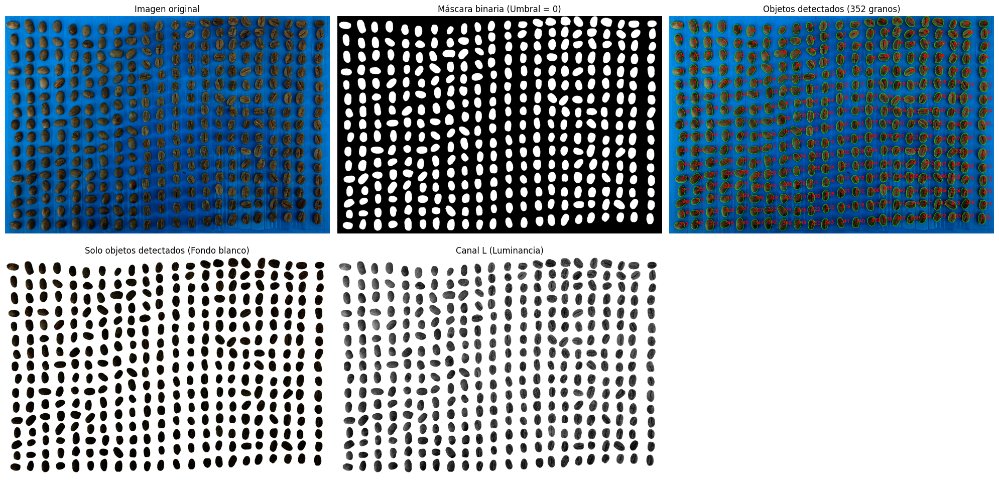

In [ ]:
# Detectar objetos en la máscara binaria
min_width = 10  # Ancho mínimo del contorno
min_height = 10  # Altura mínima del contorno
labeled_image, count, objects_only_image = detect_objects_with_contours(binary_mask_result, min_width, min_height)

# Convertir la imagen con solo objetos detectados a Lab
lab_image = _RGB2Lab(objects_only_image)

# Extraer el canal L (luminancia)
l_channel = lab_image[..., 0]

# Visualizar los resultados
plt.figure(figsize=(20, 10))

# Imagen original
plt.subplot(2, 3, 1)
plt.imshow(image)
plt.axis('off')
plt.title("Imagen original")

# Máscara binaria
plt.subplot(2, 3, 2)
plt.imshow(binary_mask_result, cmap='gray')
plt.axis('off')
plt.title(f"Máscara binaria (Umbral = {used_threshold})")

# Objetos detectados con contornos numerados
plt.subplot(2, 3, 3)
plt.imshow(labeled_image)
plt.axis('off')
plt.title(f"Objetos detectados ({count} granos)")

# Imagen con solo los objetos detectados (fondo blanco)
plt.subplot(2, 3, 4)
plt.imshow(objects_only_image)
plt.axis('off')
plt.title("Solo objetos detectados (Fondo blanco)")

# Canal L (luminancia) de la imagen en Lab
plt.subplot(2, 3, 5)
plt.imshow(l_channel, cmap='gray')
plt.axis('off')
plt.title("Canal L (Luminancia)")

plt.tight_layout()
plt.show()

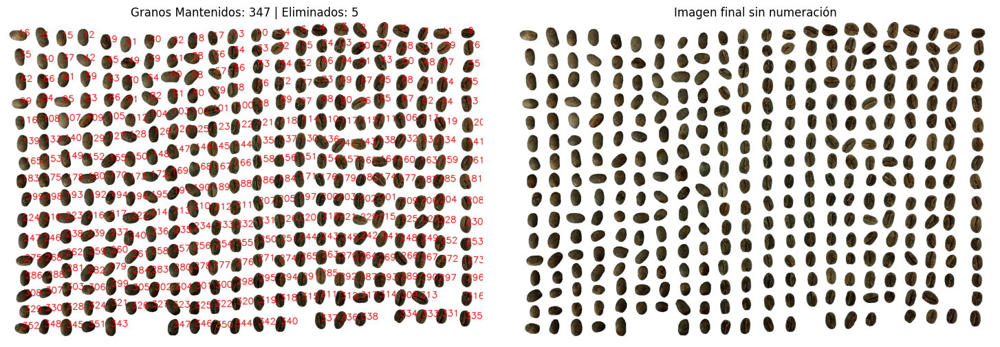

La información de los granos se ha guardado en 'informacion_granos_luminancia.txt'.


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Extraer el canal L (luminancia)
L_channel = lab_image[..., 0]

# Crear una máscara binaria inicial usando el canal b
threshold = 0
binary_mask = lab_image[..., 2] > threshold

# Aplicar cierre morfológico para eliminar ruido y unir regiones fragmentadas
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)

# Encontrar contornos en la máscara cerrada
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrar contornos pequeños
min_size = 10
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > min_size and cv.boundingRect(c)[3] > min_size]

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Etiquetar los objetos filtrados
def label_from_contours(contours, shape):
    labeled_mask = np.zeros(shape[:2], dtype=np.int32)
    current_label = 1
    for contour in contours:
        cv.drawContours(labeled_mask, [contour], -1, current_label, thickness=cv.FILLED)
        current_label += 1
    return labeled_mask

labels = label_from_contours(sorted_contours, closed_mask.shape)

# Crear máscaras para granos mantenidos y eliminados
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)

granos_mantener = 0
granos_eliminados = 0
grano_info = []  # Guardar información de los granos en el orden correcto

# Filtrar los objetos según el rango de L
for i, contour in enumerate(sorted_contours, start=1):
    coords = np.argwhere(labels == i)
    if len(coords) == 0:
        continue

    L_values = L_channel[coords[:, 0], coords[:, 1]]
    mean_L = np.mean(L_values)

    if 40 <= mean_L <= 70:
        filtered_mask[coords[:, 0], coords[:, 1]] = True
        granos_mantener += 1
        resultado = "Pasa"
    else:
        eliminated_mask[coords[:, 0], coords[:, 1]] = True
        granos_eliminados += 1
        resultado = "No pasa"

    # Se guarda con su número de grano exacto
    grano_info.append((i, mean_L, resultado))

# Crear imagen con fondo blanco y solo los granos mantenidos
image_with_kept_grains = np.ones_like(image) * 255
image_with_kept_grains[filtered_mask] = image[filtered_mask]

# Crear una copia sin numeración
image_without_numbers = image_with_kept_grains.copy()

# Dibujar números en los granos filtrados respetando el orden
for i, contour in enumerate(sorted_contours, start=1):
    if grano_info[i - 1][2] == "Pasa":  # Solo numerar los que pasaron
        x, y, w, h = cv.boundingRect(contour)
        cx, cy = x + w // 2, y + h // 2
        cv.putText(image_with_kept_grains, str(i), (cx, cy), cv.FONT_HERSHEY_SIMPLEX, 2, (225, 0, 0), 3)

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Imagen con números
plt.subplot(1, 2, 1)
plt.imshow(image_with_kept_grains)
plt.axis('off')
plt.title(f"Granos Mantenidos: {granos_mantener} | Eliminados: {granos_eliminados}")

# Imagen sin números
plt.subplot(1, 2, 2)
plt.imshow(image_without_numbers)
plt.axis('off')
plt.title("Imagen final sin numeración")

"""# Gráfico de conteo
plt.subplot(1, 3, 3)
plt.bar(["Mantenidos", "Eliminados"], [granos_mantener, granos_eliminados], color=['green', 'red'])
plt.title("Conteo de granos")
plt.ylabel("Cantidad")
"""
plt.tight_layout()
plt.show()

# Guardar la información en un archivo .txt respetando el orden
with open("_luminancia.txt", "w") as file:
    file.write(f"{'ID Grano':<15}{'Luminancia Promedio':<20}{'Resultado':<15}\n")
    file.write("-" * 50 + "\n")

    for i, mean_L, resultado in grano_info:
        file.write(f"{i:<15}{mean_L:<20.2f}{resultado:<15}\n")

    file.write("\nResumen:\n")
    file.write(f"Granos Mantenidos: {granos_mantener}\n")
    file.write(f"Granos Eliminados: {granos_eliminados}\n")

print("La información de los granos se ha guardado en 'informacion_granos_luminancia.txt'.")


##de los px

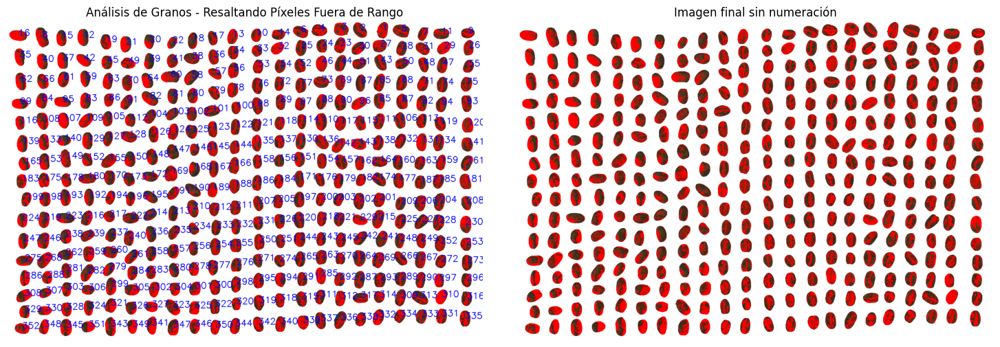

La información de los granos se ha guardado en '_luminancia_detallada.txt'.


In [ ]:
# Extraer el canal L (luminancia)
L_channel = lab_image[..., 0]

# Crear una máscara binaria inicial usando el canal b
threshold = 0
binary_mask = lab_image[..., 2] > threshold

# Aplicar cierre morfológico para eliminar ruido y unir regiones fragmentadas
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)

# Encontrar contornos en la máscara cerrada
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrar contornos pequeños
min_size = 10
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > min_size and cv.boundingRect(c)[3] > min_size]

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Etiquetar los objetos filtrados
def label_from_contours(contours, shape):
    labeled_mask = np.zeros(shape[:2], dtype=np.int32)
    current_label = 1
    for contour in contours:
        cv.drawContours(labeled_mask, [contour], -1, current_label, thickness=cv.FILLED)
        current_label += 1
    return labeled_mask

labels = label_from_contours(sorted_contours, closed_mask.shape)

# Crear máscaras para análisis de píxeles
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
out_of_range_mask = np.zeros_like(binary_mask, dtype=bool)

grano_info = []  # Guardar información de los granos en el orden correcto

# Analizar los píxeles de cada grano
for i, contour in enumerate(sorted_contours, start=1):
    coords = np.argwhere(labels == i)
    if len(coords) == 0:
        continue

    L_values = L_channel[coords[:, 0], coords[:, 1]]
    mean_L = np.mean(L_values)

    in_range_mask = (45 <= L_values) & (L_values <= 60)
    in_range_pixels = np.sum(in_range_mask)
    out_of_range_pixels = len(L_values) - in_range_pixels

    percent_in_range = (in_range_pixels / len(L_values)) * 100
    percent_out_of_range = 100 - percent_in_range

    filtered_mask[coords[in_range_mask, 0], coords[in_range_mask, 1]] = True
    out_of_range_mask[coords[~in_range_mask, 0], coords[~in_range_mask, 1]] = True

    grano_info.append((i, mean_L, in_range_pixels, out_of_range_pixels, percent_in_range, percent_out_of_range))

# Crear imagen con fondo blanco y resaltar píxeles fuera de rango en rojo
image_with_analysis = np.ones_like(image) * 255
image_with_analysis[filtered_mask] = image[filtered_mask]
image_with_analysis[out_of_range_mask] = [255, 0, 0]  # Rojo para píxeles fuera de rango

# Crear una copia sin numeración
image_without_numbers = image_with_analysis.copy()

# Dibujar números en los granos analizados
for i, contour in enumerate(sorted_contours, start=1):
    x, y, w, h = cv.boundingRect(contour)
    cx, cy = x + w // 2, y + h // 2
    cv.putText(image_with_analysis, str(i), (cx, cy), cv.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 255), 3)

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Imagen con números
plt.subplot(1, 2, 1)
plt.imshow(image_with_analysis)
plt.axis('off')
plt.title("Análisis de Granos - Resaltando Píxeles Fuera de Rango")

# Imagen sin números
plt.subplot(1, 2, 2)
plt.imshow(image_without_numbers)
plt.axis('off')
plt.title("Imagen final sin numeración")

plt.tight_layout()
plt.show()

# Guardar la información en un archivo .txt
with open("_luminancia_detallada.txt", "w") as file:
    file.write(f"{'ID Grano':<10}{'Luminancia Promedio':<20}{'Píxeles en Rango':<20}{'Píxeles Fuera de Rango':<25}{'% en Rango':<15}{'% Fuera de Rango':<15}\n")
    file.write("-" * 110 + "\n")

    for i, mean_L, in_range_pixels, out_of_range_pixels, percent_in_range, percent_out_of_range in grano_info:
        file.write(f"{i:<10}{mean_L:<20.2f}{in_range_pixels:<20}{out_of_range_pixels:<25}{percent_in_range:<15.2f}{percent_out_of_range:<15.2f}\n")

print("La información de los granos se ha guardado en '_luminancia_detallada.txt'.")


##Otro mmodo luminancia

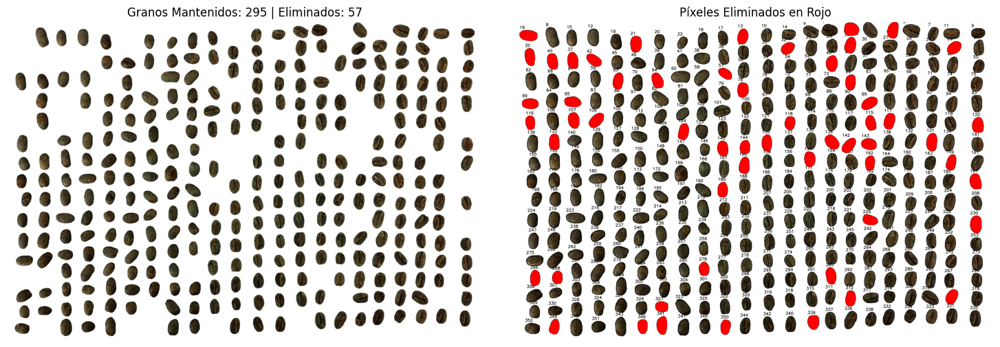

La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.


In [ ]:
# Extraer el canal L (luminancia)
L_channel = lab_image[..., 0]

# Crear una máscara binaria inicial usando el canal b
threshold = 0
binary_mask = lab_image[..., 2] > threshold

# Aplicar cierre morfológico para eliminar ruido y unir regiones fragmentadas
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)

# Encontrar contornos en la máscara cerrada
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrar contornos pequeños
min_size = 10
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > min_size and cv.boundingRect(c)[3] > min_size]

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Etiquetar los objetos filtrados
def label_from_contours(contours, shape):
    labeled_mask = np.zeros(shape[:2], dtype=np.int32)
    current_label = 1
    for contour in contours:
        cv.drawContours(labeled_mask, [contour], -1, current_label, thickness=cv.FILLED)
        current_label += 1
    return labeled_mask

labels = label_from_contours(sorted_contours, closed_mask.shape)

# Crear máscaras para granos mantenidos, eliminados y píxeles resaltados
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)
resaltado_mask = np.zeros_like(image, dtype=np.uint8)

granos_mantener = 0
granos_eliminados = 0
grano_info = []  # Guardar información de los granos en el orden correcto

# Filtrar los objetos según el rango de L
with open("_luminancia_2_detallada.txt", "w") as file:
    file.write(f"{'ID Grano':<15}{'Luminancia Promedio':<20}{'Pixeles Pasa':<15}{'Pixeles No Pasa':<15}\n")
    file.write("-" * 65 + "\n")

    for i, contour in enumerate(sorted_contours, start=1):
        coords = np.argwhere(labels == i)
        if len(coords) == 0:
            continue

        L_values = L_channel[coords[:, 0], coords[:, 1]]
        px_pasan = (L_values >= 40) & (L_values <= 60)
        px_no_pasan = ~px_pasan

        num_px_pasan = np.sum(px_pasan)
        num_px_no_pasan = np.sum(px_no_pasan)
        mean_L = np.mean(L_values)

        if num_px_pasan > num_px_no_pasan:  # Mayoría de píxeles dentro del rango
            filtered_mask[coords[:, 0], coords[:, 1]] = True
            granos_mantener += 1
            resultado = "Pasa"
        else:
            eliminated_mask[coords[:, 0], coords[:, 1]] = True
            resaltado_mask[coords[:, 0], coords[:, 1]] = [255, 0, 0]  # Rojo para píxeles eliminados
            granos_eliminados += 1
            resultado = "No pasa"

        # Guardar datos en la lista y en el archivo
        grano_info.append((i, mean_L, num_px_pasan, num_px_no_pasan, resultado))
        file.write(f"{i:<15}{mean_L:<20.2f}{num_px_pasan:<15}{num_px_no_pasan:<15}\n")

# Crear imagen resaltando píxeles eliminados en rojo
resaltado_image = image_no_background.copy()
resaltado_image[eliminated_mask] = resaltado_mask[eliminated_mask]

# Crear imagen con fondo blanco y solo los granos mantenidos
image_with_kept_grains = np.ones_like(image) * 255
image_with_kept_grains[filtered_mask] = image[filtered_mask]

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Imagen con números
plt.subplot(1, 2, 1)
plt.imshow(image_with_kept_grains)
plt.axis('off')
plt.title(f"Granos Mantenidos: {granos_mantener} | Eliminados: {granos_eliminados}")

# Imagen con píxeles eliminados resaltados en rojo
plt.subplot(1, 2, 2)
plt.imshow(resaltado_image)
plt.axis('off')
plt.title("Píxeles Eliminados en Rojo")

"""# Gráfico de conteo
plt.subplot(1, 3, 3)
plt.bar(["Mantenidos", "Eliminados"], [granos_mantener, granos_eliminados], color=['green', 'red'])
plt.title("Conteo de granos")
plt.ylabel("Cantidad")"""

plt.tight_layout()
plt.show()

print("La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.")


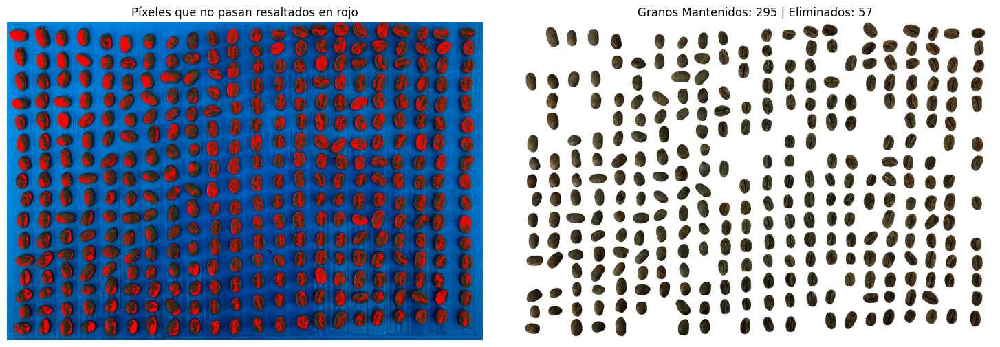

La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Crear máscaras para granos mantenidos, eliminados y píxeles resaltados
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)
resaltado_mask = np.zeros_like(image, dtype=np.uint8)  # Máscara para resaltar píxeles que no pasan
granos_mantener = 0
granos_eliminados = 0
grano_info = []  # Guardar información de los granos en el orden correcto

# Filtrar los objetos según el rango de L
with open("_luminancia_detallada.txt", "w") as file:
    file.write(f"{'ID Grano':<15}{'Luminancia Promedio':<20}{'Pixeles Pasa':<15}{'Pixeles No Pasa':<15}{'% Pasa':<15}{'% No Pasa':<15}\n")
    file.write("-" * 95 + "\n")

    for i, contour in enumerate(sorted_contours, start=1):
        coords = np.argwhere(labels == i)
        if len(coords) == 0:
            continue

        # Extraer valores de luminancia para los píxeles del grano actual
        L_values = L_channel[coords[:, 0], coords[:, 1]]
        px_pasan = (L_values >= 40) & (L_values <= 60)
        px_no_pasan = ~px_pasan

        num_px_pasan = np.sum(px_pasan)
        num_px_no_pasan = np.sum(px_no_pasan)
        total_pixeles = num_px_pasan + num_px_no_pasan

        # Calcular porcentajes
        porcentaje_pasa = (num_px_pasan / total_pixeles) * 100 if total_pixeles > 0 else 0
        porcentaje_no_pasa = (num_px_no_pasan / total_pixeles) * 100 if total_pixeles > 0 else 0

        mean_L = np.mean(L_values)
        if num_px_pasan > num_px_no_pasan:  # Mayoría de píxeles dentro del rango
            filtered_mask[coords[:, 0], coords[:, 1]] = True
            granos_mantener += 1
            resultado = "Pasa"
        else:
            eliminated_mask[coords[:, 0], coords[:, 1]] = True
            granos_eliminados += 1
            resultado = "No pasa"

        # Resaltar solo los píxeles que no pasan dentro del grano
        for idx, coord in enumerate(coords):
            if not px_pasan[idx]:  # Si el píxel no pasa, resáltalo en rojo
                resaltado_mask[coord[0], coord[1]] = [255, 0, 0]  # Rojo para píxeles que no pasan

        # Guardar datos en la lista y en el archivo
        grano_info.append((i, mean_L, num_px_pasan, num_px_no_pasan, porcentaje_pasa, porcentaje_no_pasa, resultado))
        file.write(f"{i:<15}{mean_L:<20.2f}{num_px_pasan:<15}{num_px_no_pasan:<15}{porcentaje_pasa:<15.2f}{porcentaje_no_pasa:<15.2f}\n")

# Crear imagen resaltando solo los píxeles que no pasan
resaltado_image = image.copy()  # Copia de la imagen original
resaltado_image[resaltado_mask[..., 0] > 0] = resaltado_mask[resaltado_mask[..., 0] > 0]

# Crear imagen con fondo blanco y solo los granos mantenidos
image_with_kept_grains = np.ones_like(image) * 255  # Fondo blanco
image_with_kept_grains[filtered_mask] = image[filtered_mask]

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Subplot 1: Imagen con píxeles que no pasan resaltados en rojo
plt.subplot(1, 2, 1)
plt.imshow(resaltado_image)
plt.axis('off')
plt.title("Píxeles que no pasan resaltados en rojo")

# Subplot 2: Imagen con granos mantenidos sobre fondo blanco
plt.subplot(1, 2, 2)
plt.imshow(image_with_kept_grains)
plt.axis('off')
plt.title(f"Granos Mantenidos: {granos_mantener} | Eliminados: {granos_eliminados}")

plt.tight_layout()
plt.show()

print("La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.")

##Bordes y conteo. Morfologia

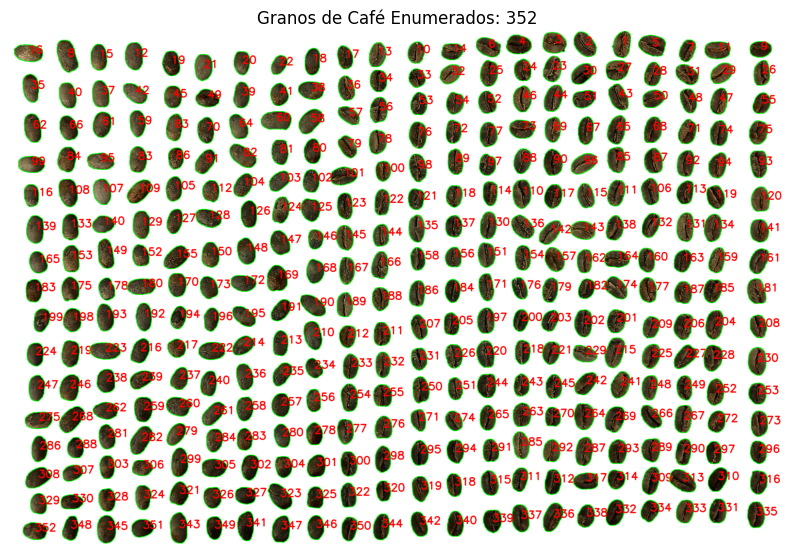

In [ ]:
# Crear una copia de la imagen original para superponer los contornos y la numeración
labeled_image = (image_no_background * 255).astype(np.uint8).copy()

# Encontrar los contornos en la imagen del cierre morfológico
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(contours, key=lambda c: cv.boundingRect(c)[1] * labeled_image.shape[1] + cv.boundingRect(c)[0])

count = 0
for i, c in enumerate(sorted_contours):
    x, y, w, h = cv.boundingRect(c)
    if w > 10 and h > 10:  # Filtrar contornos pequeños para evitar falsos positivos
        count += 1
        # Dibujar contorno del grano
        cv.drawContours(labeled_image, [c], -1, (0, 255, 0), 2)

        # Colocar el número del grano en el centro del contorno
        center_x, center_y = x + w // 2, y + h // 2
        cv.putText(labeled_image, str(count), (center_x, center_y),
                   cv.FONT_HERSHEY_SIMPLEX, 1.5, (255, 0, 0), 3, cv.LINE_AA)

# Mostrar imagen con los granos enumerados
plt.figure(figsize=(10, 10))
plt.imshow(labeled_image)
plt.title(f'Granos de Café Enumerados: {count}')
plt.axis('off')
plt.show()

##Eliminar

###Circularidad

##Filtros uno a uno

In [ ]:
# Definir umbrales para clasificación
CIRCULARITY_THRESHOLD = 0.76  # Umbral para circularidad
COMPACTNESS_THRESHOLD = 16.7   # Umbral para compacidad

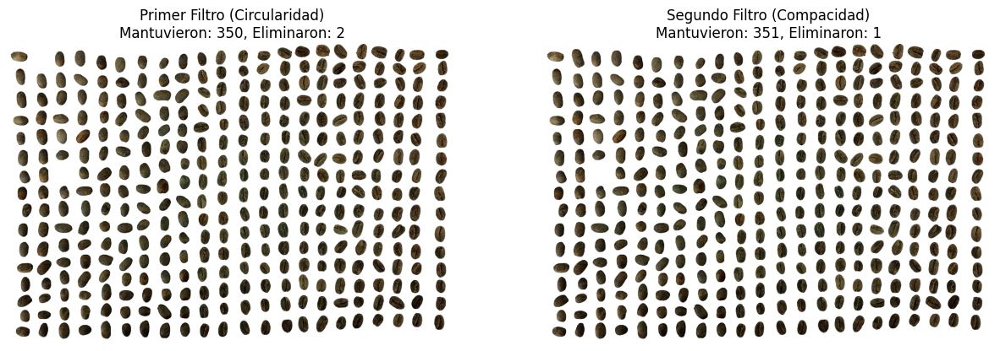


Archivo 'extra.txt' creado con éxito.


In [ ]:
# Lista para almacenar resultados adicionales
results = []
# Filtrar contornos pequeños
filtered_contours = []
for c in sorted_contours:
    x, y, w, h = cv.boundingRect(c)
    if w > 10 and h > 10:  # Filtrar contornos pequeños
        filtered_contours.append(c)

# Ordenar los contornos de izquierda a derecha y de arriba a abajo
filtered_contours = sorted(filtered_contours, key=lambda c: (cv.boundingRect(c)[1], cv.boundingRect(c)[0]))

# Crear una imagen en negro para la máscara filtrada
filtered_mask_1 = np.ones_like(image_no_background)  # Imagen después del primer filtro
filtered_mask_2 = np.ones_like(image_no_background)  # Imagen después del segundo filtro

# Contadores para el primer filtro
kept_count_1 = 0
removed_count_1 = 0

# Primer filtro: Circularidad
for i, c in enumerate(filtered_contours):
    x, y, w, h = cv.boundingRect(c)
    # Área y perímetro
    area = cv.contourArea(c)
    perimeter = cv.arcLength(c, True)
    # Circularidad
    circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0
    # Guardar resultados adicionales
    results.append((i+1, area, perimeter, circularity))
    # Clasificar el objeto según el umbral de circularidad
    if circularity >= CIRCULARITY_THRESHOLD:
        kept_count_1 += 1
        # Crear una máscara para el objeto actual
        mask = np.ones_like(image[:, :, 0], dtype=np.uint8)  # Máscara vacía
        cv.drawContours(mask, [c], -1, 255, thickness=cv.FILLED)  # Rellenar el contorno
        # Copiar el objeto a la imagen filtrada
        filtered_mask_1[mask == 255] = image[mask == 255]
    else:
        removed_count_1 += 1

# Segundo filtro: Compacidad
# Obtener los contornos que pasaron el primer filtro
filtered_contours_1 = []
for c in filtered_contours:
    x, y, w, h = cv.boundingRect(c)
    mask = np.ones_like(image[:, :, 0], dtype=np.uint8)  # Máscara vacía
    cv.drawContours(mask, [c], -1, 255, thickness=cv.FILLED)  # Rellenar el contorno
    if np.any(filtered_mask_1[mask == 255]):  # Si el objeto está en la imagen filtrada
        filtered_contours_1.append(c)

# Contadores para el segundo filtro
kept_count_2 = 0
removed_count_2 = 0
for i, c in enumerate(filtered_contours_1):
    x, y, w, h = cv.boundingRect(c)
    # Área y perímetro
    area = cv.contourArea(c)
    perimeter = cv.arcLength(c, True)
    # Compacidad
    compactness = (perimeter**2) / area if area > 0 else 0
    # Clasificar el objeto según el umbral de compacidad
    if compactness <= COMPACTNESS_THRESHOLD:
        kept_count_2 += 1
        # Crear una máscara para el objeto actual
        mask = np.ones_like(image[:, :, 0], dtype=np.uint8)  # Máscara vacía
        cv.drawContours(mask, [c], -1, 255, thickness=cv.FILLED)  # Rellenar el contorno
        # Copiar el objeto a la imagen filtrada
        filtered_mask_2[mask == 255] = image[mask == 255]
    else:
        removed_count_2 += 1

# Mostrar la imagen después del segundo filtro
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.imshow(filtered_mask_1)
plt.title(f'Primer Filtro (Circularidad)\nMantuvieron: {kept_count_1}, Eliminaron: {removed_count_1}')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(filtered_mask_2)
plt.title(f'Segundo Filtro (Compacidad)\nMantuvieron: {kept_count_2}, Eliminaron: {removed_count_2}')
plt.axis('off')
plt.show()

# Guardar resultados en un archivo .txt
with open('extra.txt', 'w') as file:
    file.write("N\tÁrea\tPerímetro\tCircularidad\n")
    for result in results:
        file.write(f"{result[0]}\t{result[1]:.2f}\t{result[2]:.2f}\t{result[3]:.2f}\n")
print("\nArchivo 'extra.txt' creado con éxito.")

##Filtros concatenados

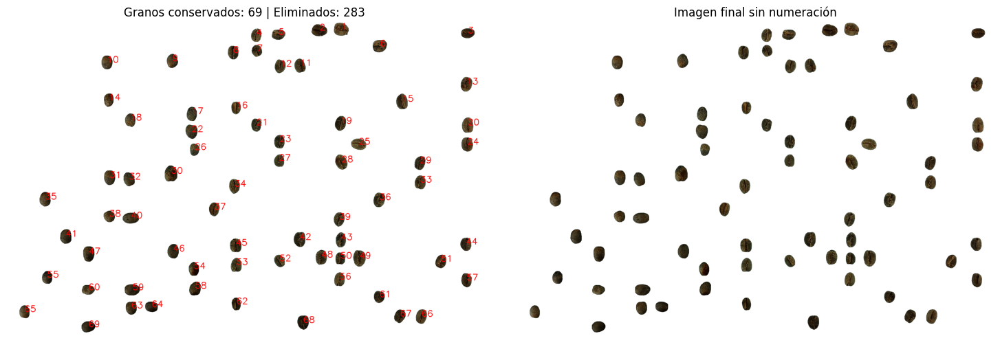

Archivo 'extra.txt' creado con éxito.
Granos conservados: 69, Granos eliminados: 283


In [ ]:


CIRCULARITY_THRESHOLD = 0.85
COMPACTNESS_THRESHOLD = 15.5

# Filtrar contornos pequeños
filtered_contours = [c for c in sorted_contours if cv.boundingRect(c)[2] > 10 and cv.boundingRect(c)[3] > 10]
filtered_contours = sorted(filtered_contours, key=lambda c: (cv.boundingRect(c)[1], cv.boundingRect(c)[0]))

# Primer filtro: Circularidad
contours_circularity = []
results_circularity = []
for c in filtered_contours:
    area = cv.contourArea(c)
    perimeter = cv.arcLength(c, True)
    circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0

    if circularity >= CIRCULARITY_THRESHOLD:
        contours_circularity.append(c)
        results_circularity.append((area, perimeter, circularity))  # Guardar en el orden original

final_contours = []
final_results = []
for i, c in enumerate(contours_circularity):
    area = cv.contourArea(c)
    perimeter = cv.arcLength(c, True)
    compactness = (perimeter**2) / area if area > 0 else 0
    circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0  # Recalcular circularidad

    if compactness <= COMPACTNESS_THRESHOLD:
        final_contours.append(c)
        final_results.append((area, perimeter, circularity))  # Guardar el valor recalculado
# Ordenar los contornos finales antes de numerarlos
sorted_final_contours = sorted(final_contours, key=lambda c: (cv.boundingRect(c)[1], cv.boundingRect(c)[0]))

# Crear máscara final con fondo blanco
final_mask = np.zeros(image.shape[:2], dtype=np.uint8)
cv.drawContours(final_mask, sorted_final_contours, -1, 255, thickness=cv.FILLED)
final_result = np.full_like(image, 255)  # Fondo blanco
final_result[final_mask == 255] = image[final_mask == 255]

# Crear una copia sin numeración
final_result_no_numbers = final_result.copy()

# Dibujar números sobre los granos filtrados en la imagen con numeración
for i, c in enumerate(sorted_final_contours):
    x, y, w, h = cv.boundingRect(c)
    cx, cy = x + w // 2, y + h // 2  # Centro del grano
    cv.putText(final_result, str(i + 1), (cx, cy), cv.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)

# Obtener conteo final
kept_count = len(final_contours)
removed_count = len(filtered_contours) - kept_count

# Crear gráficos
plt.figure(figsize=(15, 5))

# Gráfico 1: Imagen final con los granos aprobados y numerados
plt.subplot(1, 2, 1)
plt.imshow(final_result)
plt.title(f"Granos conservados: {kept_count} | Eliminados: {removed_count}")
plt.axis('off')

# Gráfico 2: Imagen filtrada sin números
plt.subplot(1, 2, 2)
plt.imshow(final_result_no_numbers)
plt.title("Imagen final sin numeración")
plt.axis('off')

"""# Gráfico 3: Barras con el conteo de filtrados
plt.subplot(1, 3, 3)
plt.bar(["Total Eliminados"], [removed_count], color='red')
plt.title("Conteo de granos eliminados")
plt.ylabel("Cantidad de granos")
plt.ylim(0, max(removed_count, kept_count) + 5)
"""
plt.tight_layout()
plt.show()

# Guardar resultados en un archivo .txt respetando el orden final
with open('_filtros_geometricos.txt', 'w') as file:
    file.write("N\tÁrea\tPerímetro\tCircularidad\n")
    for i, (area, perimeter, circularity) in enumerate(final_results):
        file.write(f"{i + 1}\t{area:.2f}\t{perimeter:.2f}\t{circularity:.2f}\n")

print(f"Archivo 'extra.txt' creado con éxito.\nGranos conservados: {kept_count}, Granos eliminados: {removed_count}")


##Aplicando color

##Croma e infomracion general

Número de objetos cerrados detectados: 352
Se detectaron 352 granos válidos.
Valores promedio de L*, a*, b*, número de píxeles, circularidad, compacidad  en 'grain_lab_values.txt'


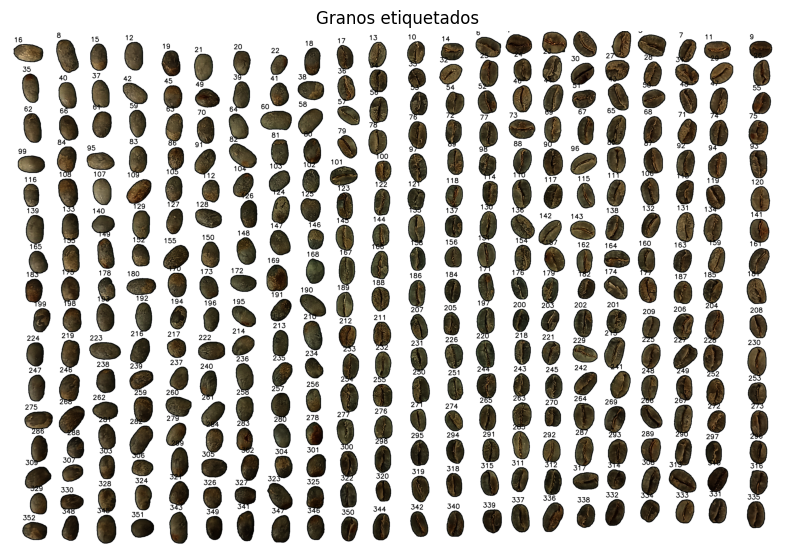

In [ ]:
# Detección de bordes usando Canny
edges = cv.Canny((binary_mask * 255).astype(np.uint8), 50, 150)

# Operación de cierre morfológico
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))  # Kernel rectangular de 5x5
closed_mask = cv.morphologyEx(edges, cv.MORPH_CLOSE, kernel)

# Contar los objetos cerrados
num_labels, labels, stats, centroids = cv.connectedComponentsWithStats(closed_mask, connectivity=8)

# Mostrar la cantidad de objetos detectados
print(f"Número de objetos cerrados detectados: {num_labels - 1}")  # Resta 1 para ignorar el fondo

# Crear una máscara binaria para separar los granos del fondo
threshold = 0  # Umbral para la máscara
binary_mask = lab_image[..., 2] > threshold

# Crear una imagen sin fondo
image_no_background = np.ones_like(image)  # Crear una imagen en negro
image_no_background[binary_mask] = image[binary_mask]  # Copiar solo los objetos detectados

# Encontrar los contornos en la imagen del cierre morfológico
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(contours, key=lambda c: cv.boundingRect(c)[1] * image.shape[1] + cv.boundingRect(c)[0])

# Lista para almacenar los valores promedio de L*, a*, b* y métricas adicionales de cada grano
grain_lab_values = []

# Crear una copia de la imagen original para superponer los contornos y la numeración
labeled_image = image_no_background  # Convertir a RGB para matplotlib

# Inicializar el contador de granos válidos
count = 0

# Definir umbrales para clasificación
CIRCULARITY_THRESHOLD = 0.8  # Granos circulares tienen circularidad cercana a 1
COMPACTNESS_THRESHOLD = 15   # Valores bajos indican formas más compactas

# Iterar sobre cada contorno (grano) y calcular las métricas
for i, contour in enumerate(sorted_contours):
    x, y, w, h = cv.boundingRect(contour)

    # Filtrar contornos pequeños para evitar falsos positivos
    if w > 10 and h > 10:
        count += 1

        # Área y perímetro
        area = cv.contourArea(contour)
        perimeter = cv.arcLength(contour, True)

        # Circularidad
        circularity = (4 * np.pi * area) / (perimeter**2) if perimeter > 0 else 0

        # Relación de aspecto
        aspect_ratio = w / h if h > 0 else 0

        # Compacidad
        compactness = (perimeter**2) / area if area > 0 else 0

        # Convexidad
        hull = cv.convexHull(contour)
        hull_area = cv.contourArea(hull)
        convexity = area / hull_area if hull_area > 0 else 0

        # Crear una máscara para el grano actual
        mask = np.zeros_like(binary_mask, dtype=np.uint8)
        cv.drawContours(mask, [contour], -1, 255, thickness=cv.FILLED)

        # Aplicar la máscara para extraer solo el grano
        masked_lab = cv.bitwise_and(lab_image, lab_image, mask=mask)

        # Obtener los píxeles no negros (es decir, los del grano)
        non_zero_pixels = masked_lab[mask == 255]

        if len(non_zero_pixels) > 0:
            # Calcular los valores promedio de L*, a*, b*
            mean_l = np.mean(non_zero_pixels[:, 0])
            mean_a = np.mean(non_zero_pixels[:, 1])
            mean_b = np.mean(non_zero_pixels[:, 2])

            # Almacenar los valores promedio y las métricas adicionales
            grain_lab_values.append((mean_l, mean_a, mean_b, len(non_zero_pixels), circularity, compactness, convexity))

            # Dibujar contorno del grano
            cv.drawContours(labeled_image, [contour], -1, (0, 0, 0), 2)

            # Superponer el número del grano en la imagen
            cv.putText(labeled_image, str(count), (x, y - 10), cv.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 0), 2)

# Guardar los valores promedio y las métricas adicionales en un archivo .txt
with open('grain_lab_values.txt', 'w') as txtfile:
    txtfile.write("Grano\tL*\ta*\tb*\tNum_Pixeles\tCircularidad\tCompacidad\n")  # Escribir encabezados
    for i, (mean_l, mean_a, mean_b, num_pixels, circularity, compactness, convexity) in enumerate(grain_lab_values):
        txtfile.write(f"{i + 1}\t{mean_l:.2f}\t{mean_a:.2f}\t{mean_b:.2f}\t{num_pixels}\t{circularity:.2f}\t{compactness:.2f}\n")

print(f"Se detectaron {count} granos válidos.")
print("Valores promedio de L*, a*, b*, número de píxeles, circularidad, compacidad  en 'grain_lab_values.txt'")

# Mostrar la imagen con los contornos y números de los granos usando matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(labeled_image)
plt.title("Granos etiquetados")
plt.axis('off')  # Desactivar ejes
plt.show()

## Cálculo del área y eq de px en mm
* se usaron datos exp para longitud ($l$) y ancho ($w$). Orignalmente estan en $mm$.
* se guarda el area en pixeles ($px^{2}$) y el area en $mm^{2}$. Tambien muestra por terminal el valor de $px$ en $mm$.

In [ ]:
# Datos teóricos en milímetros
l_mm = 10.0924  # Largo en mm
w_mm = 6.9671   # Ancho en mm

# Ordenar contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(contours, key=lambda c: cv.boundingRect(c)[1] * binary_mask.shape[1] + cv.boundingRect(c)[0])

# Lista para almacenar resultados
results = []
count = 0

# Medir el largo y el ancho del primer grano en píxeles para calcular el factor de conversión
for i, c in enumerate(sorted_contours):
    x, y, w_px, h_px = cv.boundingRect(c)
    if w_px > 10 and h_px > 10:  # Filtrar contornos pequeños
        count += 1

        # Calcular el área en píxeles
        area_px = cv.contourArea(c)

        # Si es el primer grano, calcular el factor de conversión
        if count == 1:
            # Asumimos que este grano tiene las dimensiones teóricas dadas
            px_per_mm_l = w_px / l_mm  # Píxeles por mm en el largo
            px_per_mm_w = h_px / w_mm  # Píxeles por mm en el ancho

            # Promedio de los factores de conversión para mayor precisión
            px_per_mm = (px_per_mm_l + px_per_mm_w) / 2
            mm_per_px = 1 / px_per_mm  # Milímetros por píxel

            # Mostrar el factor de conversión por pantalla
            print(f"Un mm equivale a {px_per_mm:.2f} píxeles.")

        # Convertir el área en píxeles a mm²
        area_mm2 = area_px * (mm_per_px ** 2)

        # Guardar resultados
        results.append((count, area_px, area_mm2))

# Crear archivo .txt con los resultados
with open('area_granos.txt', 'w') as file:
    file.write("N\tArea_px2\tArea_mm2\n")
    for result in results:
        file.write(f"{result[0]}\t{result[1]:.2f}\t{result[2]:.2f}\n")

print("Archivo 'area_granos.txt' creado con éxito.")

Un mm equivale a 12.63 píxeles.
Archivo 'area_granos.txt' creado con éxito.


In [ ]:
# Datos teóricos en milímetros
l_mm = 10.0924  # Largo en mm
w_mm = 6.9671   # Ancho en mm

# Lista para almacenar resultados
results = []
count = 0

for i, c in enumerate(sorted_contours):
    x, y, w_px, h_px = cv.boundingRect(c)
    if w_px > 10 and h_px > 10:  # Filtrar contornos pequeños
        count += 1

        # Calcular el área en píxeles
        area_px = cv.contourArea(c)

        # Si es el primer grano, calcular el factor de conversión
        if count == 1:
            px_per_mm_l = w_px / l_mm  # Píxeles por mm en el largo
            px_per_mm_w = h_px / w_mm  # Píxeles por mm en el ancho
            px_per_mm = (px_per_mm_l + px_per_mm_w) / 2
            mm_per_px = 1 / px_per_mm  # Milímetros por píxel
            print(f"Un mm equivale a {px_per_mm:.2f} píxeles.")

        # Convertir el área en píxeles a mm²
        area_mm2 = area_px * (mm_per_px ** 2)

        # Calcular perímetro en píxeles
        perimeter_px = cv.arcLength(c, True)

        # Calcular circularidad
        if perimeter_px == 0:
            circularity = 0
        else:
            circularity = (4 * np.pi * area_px) / (perimeter_px ** 2)

        # Calcular excentricidad (aproximación a una elipse)
        if len(c) >= 5:  # Necesitamos al menos 5 puntos para calcular momentos
            moments = cv.moments(c)
            if moments['mu20'] + moments['mu02'] == 0:
                eccentricity = 0
                area_elipse_px = 0
            else:
                # Fórmula para la excentricidad basada en los momentos centrales
                temp1 = moments['mu20'] + moments['mu02']
                temp2 = np.sqrt(4 * moments['mu11']**2 + (moments['mu20'] - moments['mu02'])**2)
                lambda1 = 0.5 * (temp1 + temp2)  # Eje mayor al cuadrado
                lambda2 = 0.5 * (temp1 - temp2)  # Eje menor al cuadrado

                # Evitar división por cero
                if lambda1 == 0 or lambda2 == 0:
                    eccentricity = 0
                    area_elipse_px = 0
                else:
                    eccentricity = np.sqrt(1 - (lambda2 / lambda1))  # Excentricidad
                    a = np.sqrt(lambda1)  # Semieje mayor
                    b = np.sqrt(lambda2)  # Semieje menor
                    area_elipse_px = np.pi * a * b  # Área de la elipse ideal en píxeles
        else:
            eccentricity = 0
            area_elipse_px = 0

        # Calcular error porcentual
        if area_elipse_px == 0 or area_px == 0:
            error_porcentual = 0
        else:
            error_porcentual = abs((area_px - area_elipse_px) / area_elipse_px) * 100

        # Guardar resultados
        results.append((count, area_px, area_mm2, circularity, eccentricity, error_porcentual))

# Crear archivo .txt con los resultados
with open('elipse_granos.txt', 'w') as file:
    file.write("N\tArea_px2\tArea_mm2\tCircularidad\tExcentricidad\tError_Porcentual\n")
    for result in results:
        file.write(f"{result[0]}\t{result[1]:.2f}\t{result[2]:.2f}\t{result[3]:.2f}\t{result[4]:.2f}\t{result[5]:.2f}\n")

print("Archivo 'elipse_granos.txt' creado con éxito.")

Un mm equivale a 12.63 píxeles.
Archivo 'elipse_granos.txt' creado con éxito.


##EStadistica de todos los canales.

#filtros final?
* L y luego geometricos
* geometricos y luego L


##Geometrico y depues luminancia

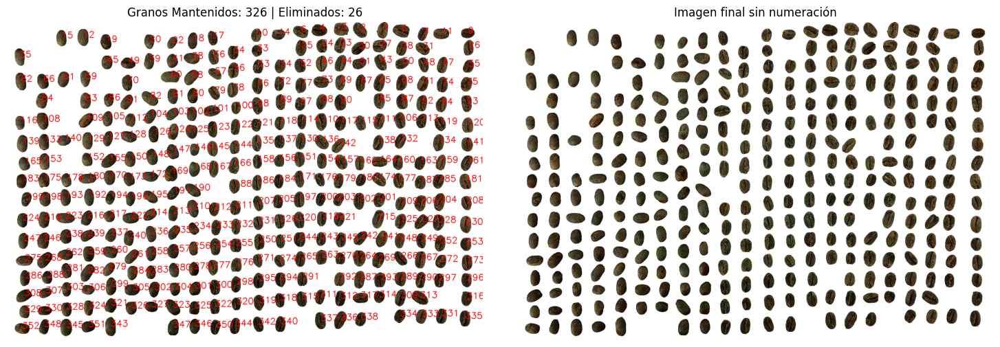


Resumen de eliminaciones:
Total eliminados: 26
  - Eliminados por Luminancia: 24
  - Eliminados por Circularidad: 2
  - Eliminados por Compacidad: 0
La información se ha guardado en 'informacion_granos_filtros.txt'.


In [ ]:
# Parámetros de los filtros
L_min, L_max = 40, 60  # Rango de luminancia aceptado
circularidad_min =0.76  # Circularidad mínima aceptada
compacidad_max = 16.7  # Compacidad máxima aceptada

# Extraer el canal L (luminancia)
L_channel = lab_image[..., 0]

# Crear una máscara binaria inicial usando el canal b
threshold = 0
binary_mask = lab_image[..., 2] > threshold

# Aplicar cierre morfológico para eliminar ruido y unir regiones fragmentadas
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)

# Encontrar contornos en la máscara cerrada
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrar contornos pequeños
min_size = 10
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > min_size and cv.boundingRect(c)[3] > min_size]

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Etiquetar los objetos filtrados
def label_from_contours(contours, shape):
    labeled_mask = np.zeros(shape[:2], dtype=np.int32)
    current_label = 1
    for contour in contours:
        cv.drawContours(labeled_mask, [contour], -1, current_label, thickness=cv.FILLED)
        current_label += 1
    return labeled_mask

labels = label_from_contours(sorted_contours, closed_mask.shape)

# Crear máscaras para granos mantenidos y eliminados en cada filtro
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)

# Contadores de granos
granos_mantener = 0
granos_eliminados = 0
eliminados_L = 0
eliminados_Circ = 0
eliminados_Comp = 0

grano_info = []  # Guardar información de los granos en el orden correcto

# Aplicar los tres filtros en orden
for i, contour in enumerate(sorted_contours, start=1):
    coords = np.argwhere(labels == i)
    if len(coords) == 0:
        continue

    L_values = L_channel[coords[:, 0], coords[:, 1]]
    mean_L = np.mean(L_values)

    if not (L_min <= mean_L <= L_max):
        eliminated_mask[coords[:, 0], coords[:, 1]] = True
        grano_info.append((i, mean_L, "-", "-", "No pasa Luminancia"))
        eliminados_L += 1
        continue

    area = cv.contourArea(contour)
    perimeter = cv.arcLength(contour, True)

    if perimeter == 0:
        eliminated_mask[coords[:, 0], coords[:, 1]] = True
        grano_info.append((i, mean_L, "-", "-", "No pasa Circularidad"))
        eliminados_Circ += 1
        continue

    circularidad = (4 * np.pi * area) / (perimeter ** 2)

    if circularidad < circularidad_min:
        eliminated_mask[coords[:, 0], coords[:, 1]] = True
        grano_info.append((i, mean_L, circularidad, "-", "No pasa Circularidad"))
        eliminados_Circ += 1
        continue

    compacidad = (perimeter ** 2) / area

    if compacidad > compacidad_max:
        eliminated_mask[coords[:, 0], coords[:, 1]] = True
        grano_info.append((i, mean_L, circularidad, compacidad, "No pasa Compacidad"))
        eliminados_Comp += 1
        continue

    filtered_mask[coords[:, 0], coords[:, 1]] = True
    granos_mantener += 1
    grano_info.append((i, mean_L, circularidad, compacidad, "Pasa"))

# Total de eliminados
granos_eliminados = eliminados_L + eliminados_Circ + eliminados_Comp

# Crear imagen con fondo blanco y solo los granos mantenidos
image_with_kept_grains = np.ones_like(image) * 255
image_with_kept_grains[filtered_mask] = image[filtered_mask]

# Crear una copia sin numeración
image_without_numbers = image_with_kept_grains.copy()

# Dibujar números en los granos filtrados respetando el orden
for i, contour in enumerate(sorted_contours, start=1):
    if grano_info[i - 1][4] == "Pasa":  # Solo numerar los que pasaron
        x, y, w, h = cv.boundingRect(contour)
        cx, cy = x + w // 2, y + h // 2
        cv.putText(image_with_kept_grains, str(i), (cx, cy), cv.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Imagen con números
plt.subplot(1, 2, 1)
plt.imshow(image_with_kept_grains)
plt.axis('off')
plt.title(f"Granos Mantenidos: {granos_mantener} | Eliminados: {granos_eliminados}")

# Imagen sin números
plt.subplot(1, 2, 2)
plt.imshow(image_without_numbers)
plt.axis('off')
plt.title("Imagen final sin numeración")


plt.tight_layout()
plt.show()

# Guardar la información en un archivo .txt respetando el orden
with open("_filtros_3.txt", "w") as file:
    file.write(f"{'ID Grano':<10}{'Luminancia':<15}{'Circularidad':<15}{'Compacidad':<15}{'Resultado':<20}\n")
    file.write("-" * 70 + "\n")

    for i, mean_L, circularidad, compacidad, resultado in grano_info:
        L_text = f"{mean_L:.2f}" if isinstance(mean_L, float) else "-"
        C_text = f"{circularidad:.2f}" if isinstance(circularidad, float) else "-"
        P_text = f"{compacidad:.2f}" if isinstance(compacidad, float) else "-"
        file.write(f"{i:<10}{L_text:<15}{C_text:<15}{P_text:<15}{resultado:<20}\n")

    file.write("\nResumen:\n")
    file.write(f"Granos Mantenidos: {granos_mantener}\n")
    file.write(f"Granos Eliminados: {granos_eliminados}\n")
    file.write(f"Eliminados por Luminancia: {eliminados_L}\n")
    file.write(f"Eliminados por Circularidad: {eliminados_Circ}\n")
    file.write(f"Eliminados por Compacidad: {eliminados_Comp}\n")

print("\nResumen de eliminaciones:")
print(f"Total eliminados: {granos_eliminados}")
print(f"  - Eliminados por Luminancia: {eliminados_L}")
print(f"  - Eliminados por Circularidad: {eliminados_Circ}")
print(f"  - Eliminados por Compacidad: {eliminados_Comp}")
print("La información se ha guardado en 'informacion_granos_filtros.txt'.")


In [ ]:
# Celda 1 - Procesamiento y almacenamiento en arrays
# -----------------------------------------------------------------
import cv2 as cv
import numpy as np

# Almacenar todos los resultados en un diccionario
procesamiento_resultados = {
    'imagenes': {},
    'datos_granos': {},
    'estadisticas': {}
}

# Parámetros del filtro
L_min, L_max = 40, 60

# Procesamiento (similar al anterior)
L_channel = lab_image[..., 0]
binary_mask = lab_image[..., 2] > 0
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrado y ordenamiento
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > 10 and cv.boundingRect(c)[3] > 10]
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Arrays para almacenar datos
grano_info_array = []
L_values_array = []
resultados_array = []

# Máscaras
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)

# Procesar cada contorno
for i, contour in enumerate(sorted_contours, 1):
    coords = np.argwhere(labels == i)
    if len(coords) == 0: continue

    L_values = L_channel[coords[:, 0], coords[:, 1]]
    mean_L = np.mean(L_values)
    resultado = "Pasa" if L_min <= mean_L <= L_max else "No pasa"

    # Almacenar en arrays
    grano_info_array.append(i)
    L_values_array.append(mean_L)
    resultados_array.append(resultado)

    if resultado == "Pasa":
        filtered_mask[coords[:, 0], coords[:, 1]] = True
    else:
        eliminated_mask[coords[:, 0], coords[:, 1]] = True

# Guardar todos los resultados en el diccionario
procesamiento_resultados['imagenes'] = {
    'original': image,
    'mascara_filtrada': filtered_mask,
    'mascara_eliminada': eliminated_mask,
    'granos_mantenidos': np.ones_like(image) * 255
}

procesamiento_resultados['imagenes']['granos_mantenidos'][filtered_mask] = image[filtered_mask]

procesamiento_resultados['datos_granos'] = {
    'ids': np.array(grano_info_array),
    'luminancias': np.array(L_values_array),
    'resultados': np.array(resultados_array)
}

procesamiento_resultados['estadisticas'] = {
    'total_mantenidos': np.sum(resultados_array == "Pasa"),
    'total_eliminados': np.sum(resultados_array == "No pasa"),
    'eliminados_L': np.sum(resultados_array == "No pasa")
}

Granos mantenidos: 0
Granos eliminados: 0

ID Grano   Luminancia      Resultado      
----------------------------------------
1          57.10           Pasa           
2          54.59           Pasa           
3          56.71           Pasa           
4          43.98           Pasa           
5          52.29           Pasa           
6          54.33           Pasa           
7          51.48           Pasa           
8          58.09           Pasa           
9          45.13           Pasa           
10         56.58           Pasa           
11         55.86           Pasa           
12         59.05           Pasa           
13         60.44           No pasa        
14         53.80           Pasa           
15         58.00           Pasa           
16         66.94           No pasa        
17         49.21           Pasa           
18         49.86           Pasa           
19         46.13           Pasa           
20         56.52           Pasa           
21         63

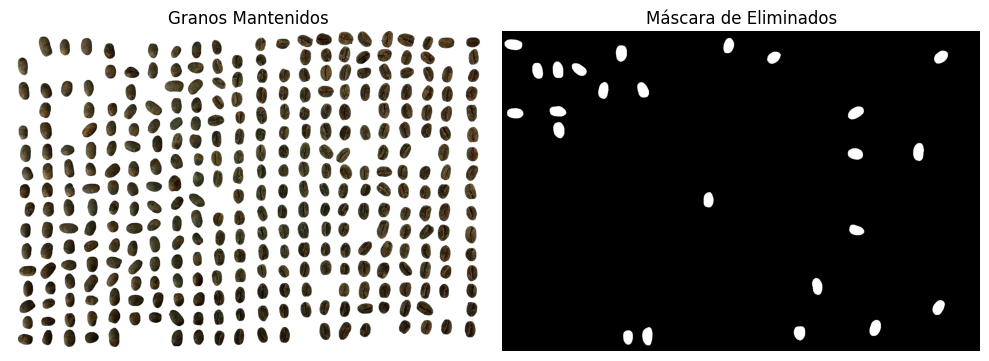

In [ ]:
# Celda 2 - Visualización y reportes
# -----------------------------------------------------------------
from matplotlib import pyplot as plt

# Recuperar datos del procesamiento
datos = procesamiento_resultados['datos_granos']
stats = procesamiento_resultados['estadisticas']
img_mantenidos = procesamiento_resultados['imagenes']['granos_mantenidos']


print("{:<10} {:<15} {:<15}".format('ID Grano', 'Luminancia', 'Resultado'))
print("-" * 40)
for id_grano, L, res in zip(datos['ids'], datos['luminancias'], datos['resultados']):
    print(f"{id_grano:<10} {L:.2f}{'':<10} {res:<15}")

# Visualizar imágenes
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_mantenidos)
plt.title('Granos Mantenidos')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(procesamiento_resultados['imagenes']['mascara_eliminada'], cmap='gray')
plt.title('Máscara de Eliminados')
plt.axis('off')

plt.tight_layout()
plt.show()

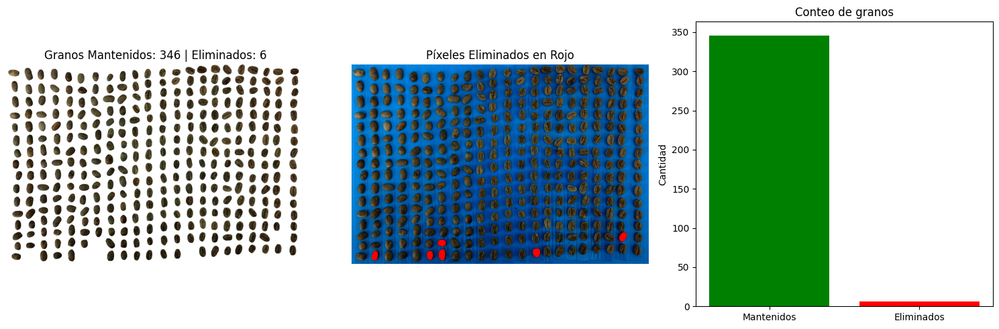

La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.


In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Extraer el canal L (luminancia)
L_channel = lab_image[..., 0]

# Crear una máscara binaria inicial usando el canal b
threshold = 0
binary_mask = lab_image[..., 2] > threshold

# Aplicar cierre morfológico para eliminar ruido y unir regiones fragmentadas
kernel = cv.getStructuringElement(cv.MORPH_RECT, (5, 5))
closed_mask = cv.morphologyEx((binary_mask * 255).astype(np.uint8), cv.MORPH_CLOSE, kernel)

# Encontrar contornos en la máscara cerrada
contours, _ = cv.findContours(closed_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filtrar contornos pequeños
min_size = 10
filtered_contours = [c for c in contours if cv.boundingRect(c)[2] > min_size and cv.boundingRect(c)[3] > min_size]

# Ordenar los contornos de izquierda a derecha y de arriba hacia abajo
sorted_contours = sorted(filtered_contours, key=lambda c: cv.boundingRect(c)[1] * closed_mask.shape[1] + cv.boundingRect(c)[0])

# Etiquetar los objetos filtrados
def label_from_contours(contours, shape):
    labeled_mask = np.zeros(shape[:2], dtype=np.int32)
    current_label = 1
    for contour in contours:
        cv.drawContours(labeled_mask, [contour], -1, current_label, thickness=cv.FILLED)
        current_label += 1
    return labeled_mask

labels = label_from_contours(sorted_contours, closed_mask.shape)

# Crear máscaras para granos mantenidos, eliminados y píxeles resaltados
filtered_mask = np.zeros_like(binary_mask, dtype=bool)
eliminated_mask = np.zeros_like(binary_mask, dtype=bool)
resaltado_mask = np.zeros_like(image, dtype=np.uint8)

granos_mantener = 0
granos_eliminados = 0
grano_info = []  # Guardar información de los granos en el orden correcto

# Filtrar los objetos según el rango de L
with open("_luminancia_detallada.txt", "w") as file:
    file.write(f"{'ID Grano':<15}{'Luminancia Promedio':<20}{'Pixeles Totales':<15}{'Pixeles Pasa':<15}{'Pixeles No Pasa':<15}{'% Pasa':<10}{'% No Pasa':<10}\n")
    file.write("-" * 105 + "\n")

    for i, contour in enumerate(sorted_contours, start=1):
        coords = np.argwhere(labels == i)
        if len(coords) == 0:
            continue

        L_values = L_channel[coords[:, 0], coords[:, 1]]
        px_pasan = (L_values >= 40) & (L_values <= 70)
        px_no_pasan = ~px_pasan

        num_px_pasan = np.sum(px_pasan)
        num_px_no_pasan = np.sum(px_no_pasan)
        total_px = num_px_pasan + num_px_no_pasan

        porcentaje_pasa = (num_px_pasan / total_px) * 100 if total_px > 0 else 0
        porcentaje_no_pasa = (num_px_no_pasan / total_px) * 100 if total_px > 0 else 0

        mean_L = np.mean(L_values)

        if num_px_pasan > num_px_no_pasan:  # Mayoría de píxeles dentro del rango
            filtered_mask[coords[:, 0], coords[:, 1]] = True
            granos_mantener += 1
            resultado = "Pasa"
        else:
            eliminated_mask[coords[:, 0], coords[:, 1]] = True
            resaltado_mask[coords[:, 0], coords[:, 1]] = [255, 0, 0]  # Rojo para píxeles eliminados
            granos_eliminados += 1
            resultado = "No pasa"

        # Guardar datos en la lista y en el archivo
        grano_info.append((i, mean_L, total_px, num_px_pasan, num_px_no_pasan, porcentaje_pasa, porcentaje_no_pasa, resultado))
        file.write(f"{i:<15}{mean_L:<20.2f}{total_px:<15}{num_px_pasan:<15}{num_px_no_pasan:<15}{porcentaje_pasa:<10.2f}{porcentaje_no_pasa:<10.2f}\n")

# Crear imagen resaltando píxeles eliminados en rojo
resaltado_image = image.copy()
resaltado_image[eliminated_mask] = resaltado_mask[eliminated_mask]

# Crear imagen con fondo blanco y solo los granos mantenidos
image_with_kept_grains = np.ones_like(image) * 255
image_with_kept_grains[filtered_mask] = image[filtered_mask]

# Mostrar imágenes y gráficos
plt.figure(figsize=(15, 5))

# Imagen con números
plt.subplot(1, 3, 1)
plt.imshow(image_with_kept_grains)
plt.axis('off')
plt.title(f"Granos Mantenidos: {granos_mantener} | Eliminados: {granos_eliminados}")

# Imagen con píxeles eliminados resaltados en rojo
plt.subplot(1, 3, 2)
plt.imshow(resaltado_image)
plt.axis('off')
plt.title("Píxeles Eliminados en Rojo")

# Gráfico de conteo
plt.subplot(1, 3, 3)
plt.bar(["Mantenidos", "Eliminados"], [granos_mantener, granos_eliminados], color=['green', 'red'])
plt.title("Conteo de granos")
plt.ylabel("Cantidad")

plt.tight_layout()
plt.show()

print("La información detallada de los granos se ha guardado en '_luminancia_detallada.txt'.")
